## Wine Pairplots
The following functions generates:
1. Scatterplots for pairs of continuous wine features. 
2. Frequency distributions of both continuous and categorical features.

There two sets of the above plots, one set colour-coded according to wine colour and the other colour-coded according to wine quality.

In [1]:
# Requires latest Seaborn. Uncomment as required
# !pip install --upgrade seaborn

# Restart kernel afterwards if upgrade is required.

In [2]:
# Pairplots
# Note that the standard Seaborn pairplots have not been used because too many dimensions
# means that the plots are too small to see.
#

def pair_plot(dataset, hue='', palette='muted', save_figure=False): 
    # Plots pairs of features
    # Usage pairplot(<dataframe>, <hue field (categorical)>, <palette (optional)>, <save_figure> (boolean))
    import os
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    
    # Create plots directory if required
    if save_figure and not os.path.exists('plots'):
        os.mkdir('plots')

    cols = list(dataset.keys()) 

    for i in cols:      
        fig, ax = plt.subplots(figsize=(8,6)) 
        ax = sns.histplot(dataset[i], x=dataset[i], hue=dataset[hue], multiple="stack")
        ax.set_xlabel(i, size=16)
        ax.set_ylabel('Frequency', size=16)
        ax.set_autoscalex_on(True)
        ax.set_title('{} distribution'.format(i), size=20)
        sns.despine(left=True, bottom=True)
        if save_figure:
            plt.savefig('plots/hist {} with hue {}'.format(i,hue))
        plt.show()
        for j in [j for j in cols if cols.index(j) > cols.index(i)]:           
            fig, ax = plt.subplots(figsize=(8,6)) 
            ax = sns.scatterplot(x=dataset[i], y=dataset[j], hue=dataset[hue])
            ax.set_xlabel(i, size=16)
            ax.set_ylabel(j, size=16)
            ax.set_autoscalex_on(True)
            ax.set_title('{} versus {}'.format(i,j), size=20)  
            sns.despine(top=True, right=True)
            if save_figure:
                plt.savefig('plots/scatter {} v {} with hue {}'.format(j,i,hue))
            plt.show()
     


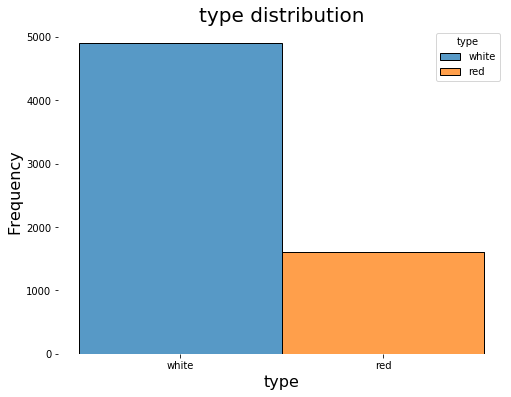

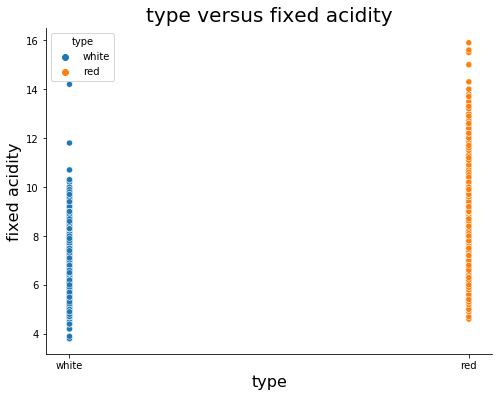

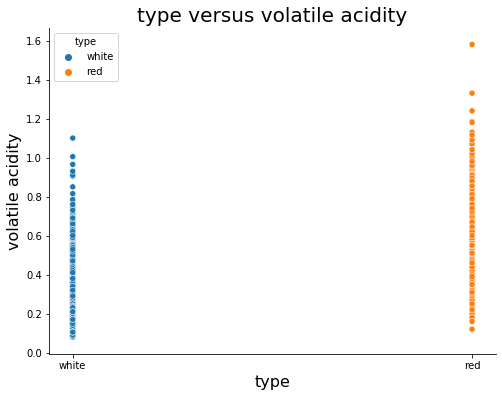

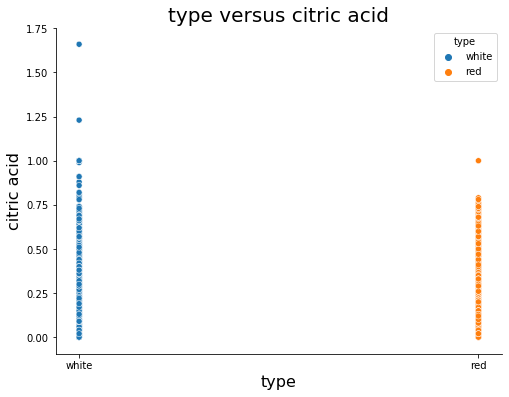

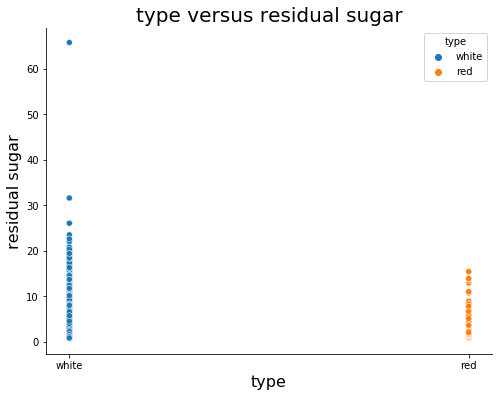

...

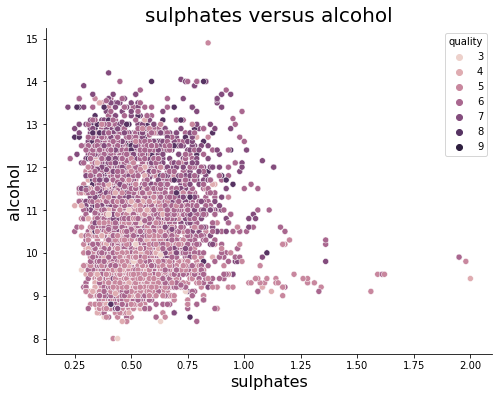

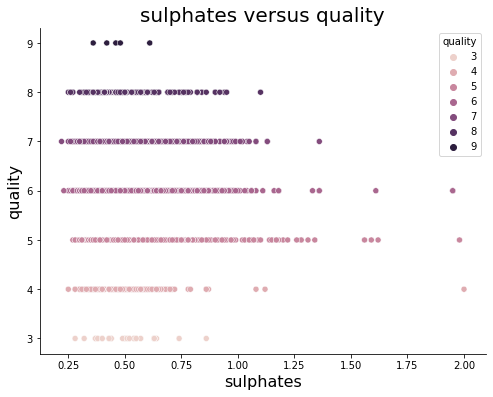

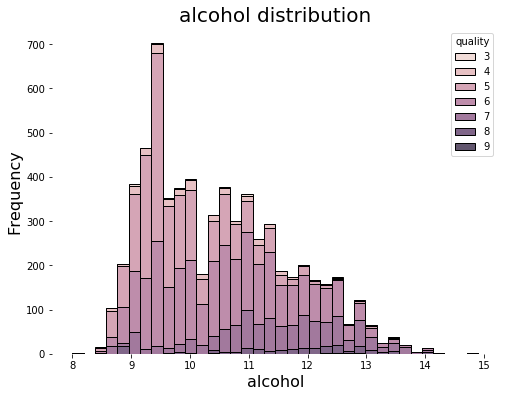

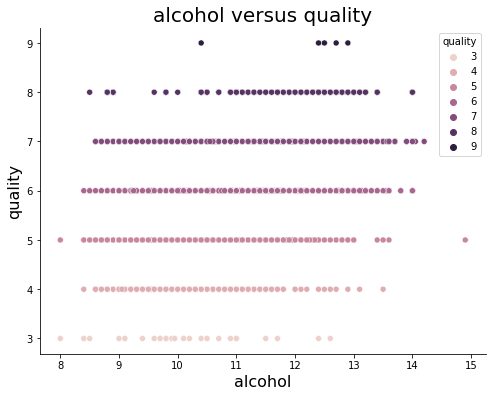

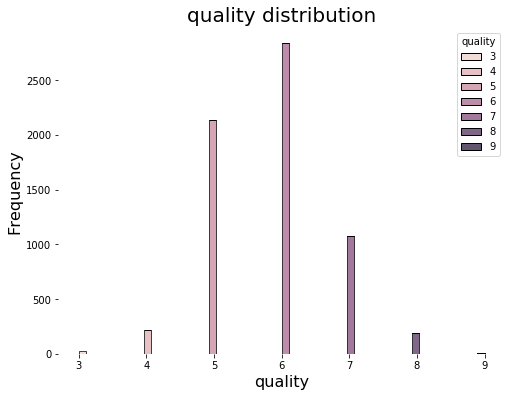

In [3]:
# Generate plots
import pandas as pd
wine_data = pd.read_csv('winequalityN.csv')

pair_plot(wine_data, hue='type', save_figure=True)
pair_plot(wine_data, hue='quality', save_figure=True)

#### Observations
Due to size limitations, we are unable to include m(any) of the above plots in the report. Whilst some are not particularly informative, others do provide an insight into our data. Below are the key observations.

- Our dataset is unbalanced in terms of the two categorical fields, "type" and "quality" with white wines outnumbering reds by over three-to-one and the majority of wines classified as quality 5, 6 or 7.
- Pairwise scatterplots show that wine "type" (colour) can often be determined quite reliably by examining just one or two features. Compared with reds,  white wines tend to have:
    - Lower volatile and fixed acidity and pH.
    - Lower fixed acidity and higher citric acid.
    - Higher residual sugar.
    - Higher free sulfur dioxide and total sulfur dioxide.
    - Lower sulphates
    - Lower chlorides.
    - Lower density
- We also observe some broad relationships between pairs of features (the list is not intended to be exhaustive).
    - A postive relationship between fixed acidity and citric acid.
    - A positve relationship between fixed acidity and chlorides.
    - A positve relationship between fixed acidity and density.
    - A negative relationship between pH and fixed acidity.

There are fewer visually-obvious relationships between input features and quality, other than that wines rated more highly tended to have higher alcohol content.   


